# Reshaping data

We offer the possibility to use layers as data source if the image cannot be directly loaded in the regular interface. Some reshaping operations can be done manually, but sometimes one needs to write a few lines of code for that. Here we show how to reshape the data and how to save them in a state compatible with the plugin. We make here a small example with data from [this Zenodo repository](https://zenodo.org/records/7944191) (Eike K Mahlandt, Sebastián Palacios Martínez, Janine JG Arts, Simon Tol, Jaap D van Buul, Joachim Goedhart (2023) Opto-RhoGEFs, an optimized optogenetic toolbox to reversibly control Rho GTPase activity on a global to subcellular scale, enabling precise control over vascular endothelial barrier strength eLife 12:RP84364 https://doi.org/10.7554/eLife.84364.3).
    

## Importing the data

We can import the data with our favorite importer. By default the environment in which the plugin is installed will contain scikit-image, tifffile and aicsimageio. We use here scikit-image:

In [6]:
import skimage
import numpy as np

In [3]:
im = skimage.io.imread("../../../Projects_data/napari-morphodynamics/goedhart/210429_OptoG011_03_OptoTIAM_LocalActivation_01.lif - FRAP 001:FRAP Pb1 Series02-1_short.tif")                       

In [4]:
im.shape

(4, 2, 1024, 1024)

The dataset contains 4 time points and 2 channels. The expectation of both the plugin and the default napari reader is that the channel dimension should be in first place. We therefore have to move the first dimension in second place:

In [7]:
im = np.moveaxis(im, 0, 1)

In [8]:
im.shape

(2, 4, 1024, 1024)

Now the data have the correct dimensions. For example if we open them in napari, we get:

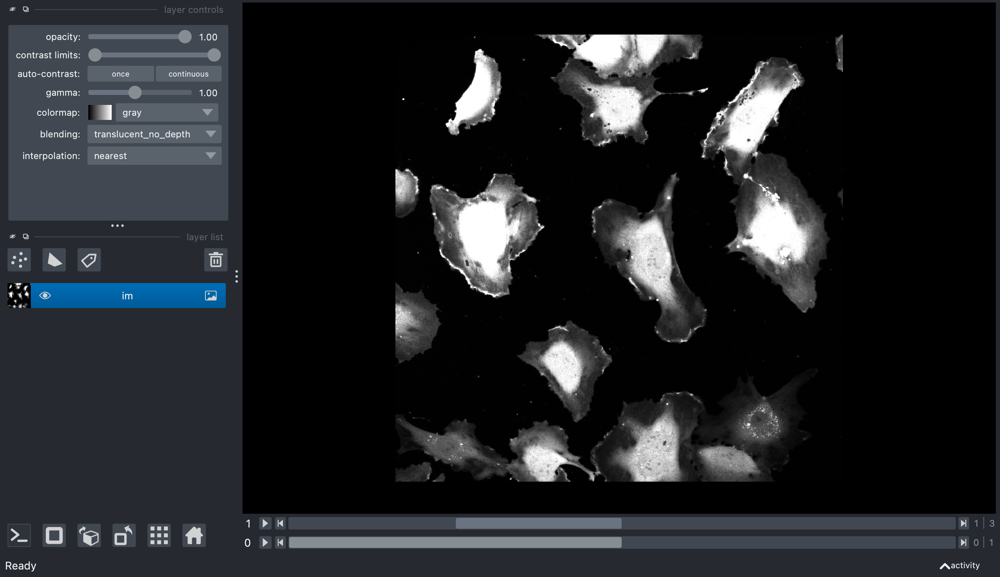

In [13]:
import napari
from napari.utils import nbscreenshot
viewer = napari.Viewer()
viewer.add_image(im)
nbscreenshot(viewer)


And we can now easily split the layer into multiple channels:

In [14]:
from napari.layers._layer_actions import _split_stack
_split_stack(viewer.layers)

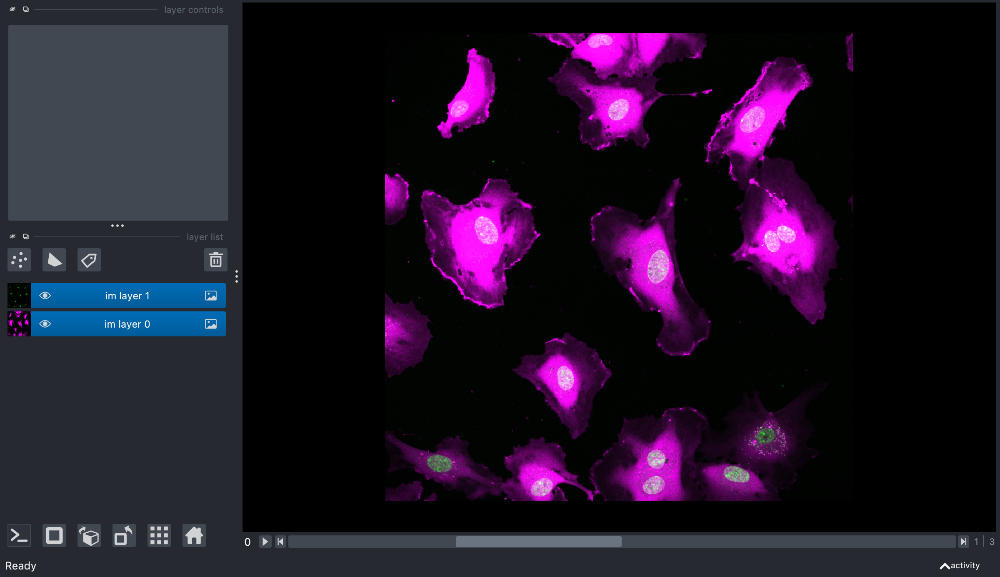

In [16]:
nbscreenshot(viewer)

If you are working anyway from an notebook, you can also directly add your data to the viewer split by channels by using:

In [17]:
viewer = napari.Viewer()
viewer.add_image(im, channel_axis=0)

[<Image layer 'Image' at 0x2a02f54c0>,
 <Image layer 'Image [1]' at 0x10826bc40>]

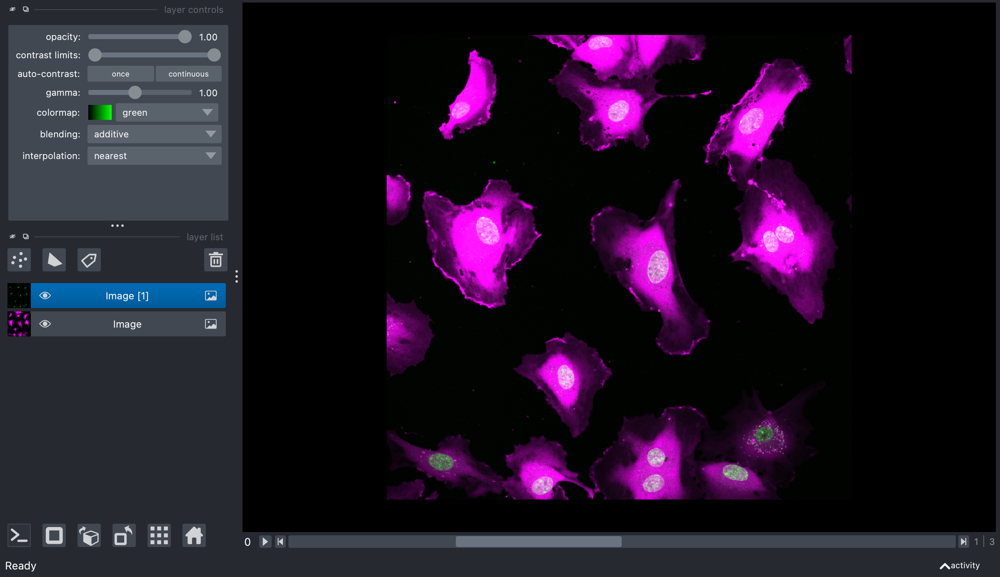

In [18]:
nbscreenshot(viewer)

## Saving data as zarr

If you want to keep your data in the correct format, we recommend to use the zarr format. Once the array has been reshaped, we can simply open a zarr file and save it there:

In [22]:
import zarr

im_zarr = zarr.open(store='../../../Projects_data/napari-morphodynamics/goedhart/zarr_format/210429_OptoG011_03_OptoTIAM.zarr', 
          shape=im.shape, chunks=(im.shape[0], 1, im.shape[-2], im.shape[-1]), dtype=np.uint16)


In [23]:
im.shape

(2, 4, 1024, 1024)

In [24]:
im_zarr.shape

(2, 4, 1024, 1024)

In [26]:
im_zarr.chunks

(2, 1, 1024, 1024)

The shape arguments specifies the dimensions of the zarr array which are the same as those of the original numpy array. zarr is a format that simplifies working with large data by splitting them into smaller parts called chunks. When we save data, we can specify the size of a chunk. As we typically load all channels of a given time point, our ideal chunks have dimensions ```[T,1,YX]```, the ```1``` standing for "one time point". When saved in this way, the data can then be used seamlessly in the plugin.